In [1]:
import cv2
import json
import glob
import pickle
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [178]:
from IPython.display import Image, display
from ipywidgets import widgets, interact, IntSlider, FloatSlider

In [2]:
test_images_path = [path for path in glob.glob('./test_images/*.jpg')]

In [4]:
test_images_path

['./test_images/straight_lines1.jpg',
 './test_images/test2.jpg',
 './test_images/straight_lines2.jpg',
 './test_images/test4.jpg',
 './test_images/test1.jpg',
 './test_images/test6.jpg',
 './test_images/test5.jpg',
 './test_images/test3.jpg']

In [193]:
binary_mask_config = {}

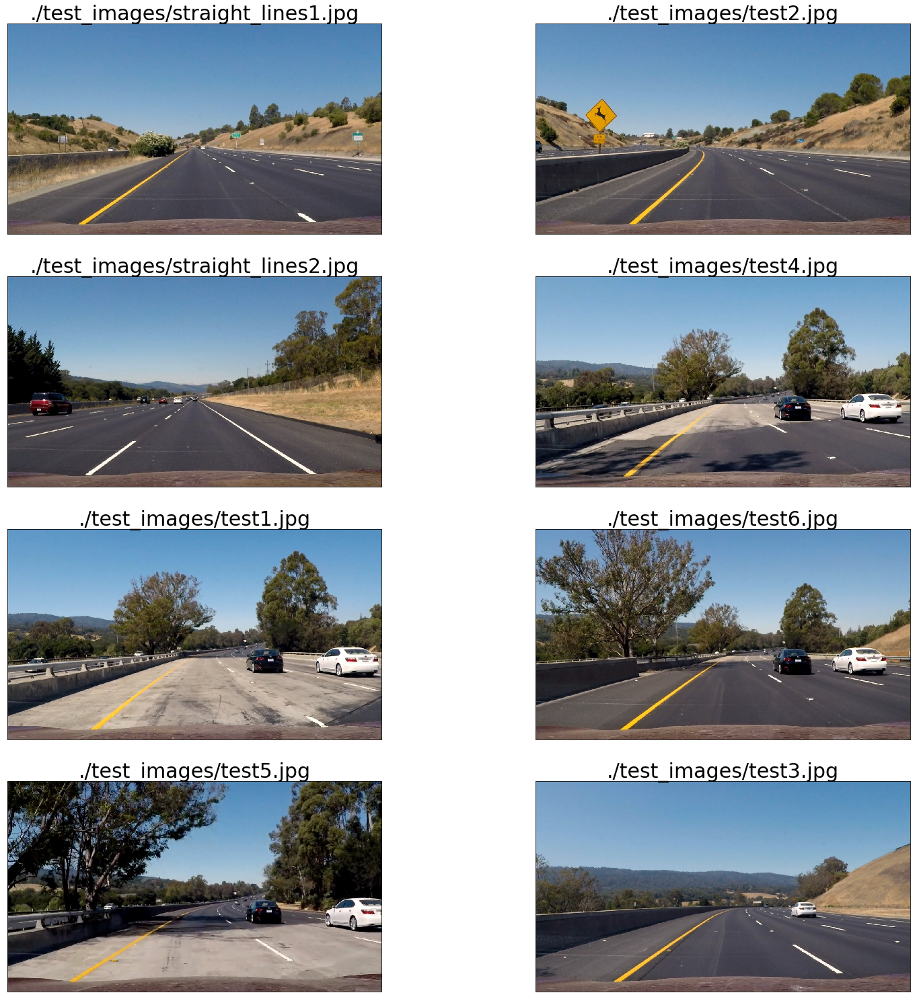

In [11]:
fig, axes = plt.subplots(4, 2, figsize=(20, 20))
axes = axes.flatten()
for index, path in enumerate(test_images_path):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    axes[index].imshow(img)
    axes[index].set_title(path, fontsize=30)
    axes[index].set_xticks([])
    axes[index].set_yticks([])
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)

### make function

In [45]:
def plot_all_images(images_path):
    """
    plot all passed image by 2 columns
    
    args:
        images_path(list of str): list of image path you want to plot
    """
    
    nimage = len(images_path)
    ncols = 2
    nrows = nimage//ncols if (nimage%ncols==0) else (nimage//ncols) + 1
    
    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 5*nrows))
    axes = axes.flatten()
    for index, path in enumerate(images_path):
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        axes[index].imshow(img)
        axes[index].set_title(path, fontsize=30)
        axes[index].set_xticks([])
        axes[index].set_yticks([])
        plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
        
    fig.tight_layout()

#### test

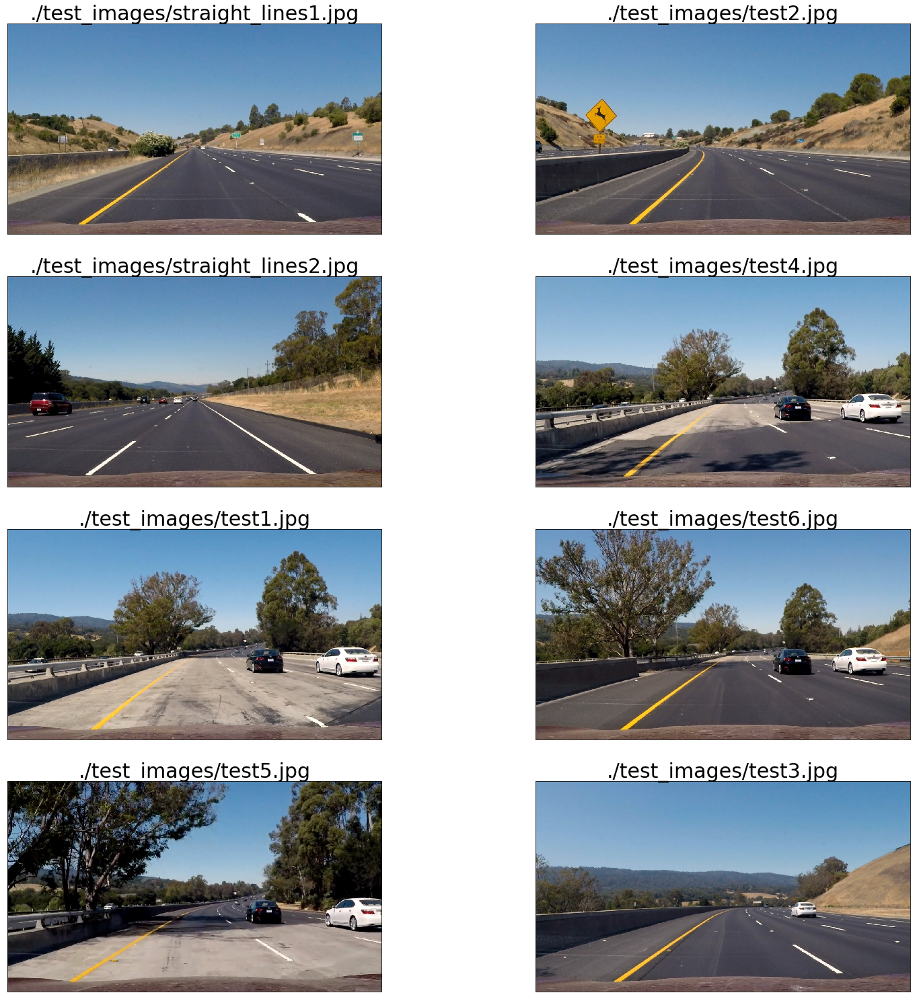

In [19]:
plot_all_images(test_images_path)

# 2. undistort image

In [21]:
with open('experimental/data.pickle', 'rb') as f:
    data = pickle.load(f)

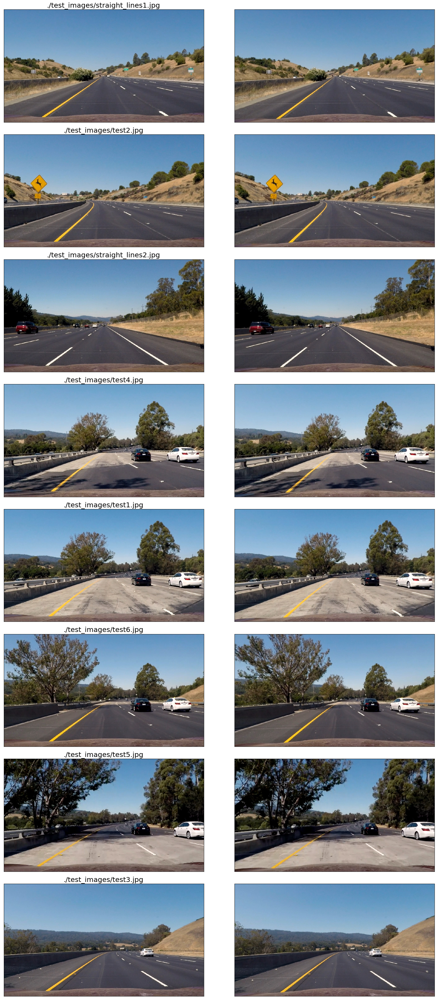

In [26]:
fig, axes = plt.subplots(8, 2, figsize=(20, 40))
for index, path in enumerate(test_images_path):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    dst = cv2.undistort(img, data['mtx'], data['dist'], None, data['newcameramtx'])
    
    axes[index, 0].imshow(img)
    axes[index, 0].set_xticks([])
    axes[index, 0].set_yticks([])
    axes[index, 0].set_title(path, fontsize=20)
    axes[index, 1].imshow(dst)
    axes[index, 1].set_xticks([])
    axes[index, 1].set_yticks([])
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    
    
fig.tight_layout()

### make function for save

In [39]:
def undistort_and_save_image(images_path, data):
    """
    undistort image based on camera matrix and distortion coefficient.
    save image to the same directory of original image located.
    
    args:
        images_path(list of str): list of image path you want to undistort and save.
        data(dict): dictionary object store camera matrix and distortion coefficients.
    """
    
    img = cv2.imread(path)
    dst = cv2.undistort(img, data['mtx'], data['dist'], None, data['newcameramtx'])
    
    dst_path_name = path.replace('.jpg', '_dst.jpg')
    cv2.imwrite(dst_path_name, dst)

In [40]:
for path in test_images_path:
    save_undistort_image(path, data)

#### test

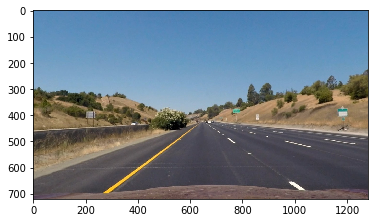

In [43]:
plt.imshow(
    cv2.cvtColor(
        cv2.imread(
            test_images_path[0].replace('.jpg', '_dst.jpg')                   
        )
    , cv2.COLOR_BGR2RGB)
)

# 3. Sobel Filter

In [46]:
sample_img = cv2.imread('./test_images/test4.jpg')
sample_img_hls = cv2.cvtColor(sample_img, cv2.COLOR_BGR2HLS)
sample_img_gray = cv2.cvtColor(sample_img, cv2.COLOR_BGR2GRAY)

In [47]:
sobelx = cv2.Sobel(sample_img_gray, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(sample_img_gray, cv2.CV_64F, 0, 1, ksize=3)

In [48]:
abs_sobelx = np.absolute(sobelx)
abs_sobely = np.absolute(sobely)

In [49]:
scaled_sobelx = np.uint8(255 * abs_sobelx / np.max(abs_sobelx))
scaled_sobely = np.uint8(255 * abs_sobely / np.max(abs_sobely))

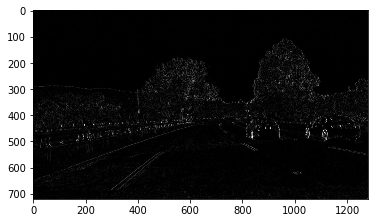

In [50]:
plt.imshow(scaled_sobelx, cmap='gray')

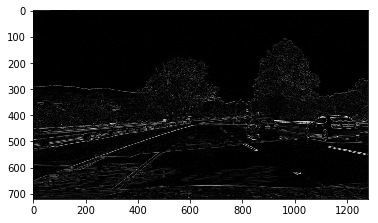

In [51]:
plt.imshow(scaled_sobely, cmap='gray')

In [12]:
thresh_min = 20
thresh_max = 100

In [13]:
sxbinary = np.zeros_like(scaled_sobelx)
sxbinary[(scaled_sobelx >= thresh_min) & (scaled_sobelx <= thresh_max)] = 1

In [14]:
sybinary = np.zeros_like(scaled_sobely)
sybinary[(scaled_sobely >= thresh_min) & (scaled_sobely <= thresh_max)] = 1

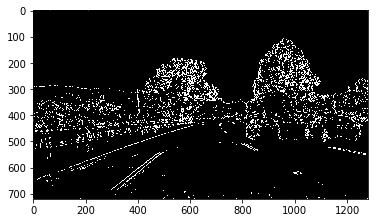

In [15]:
plt.imshow(sxbinary, cmap='gray')

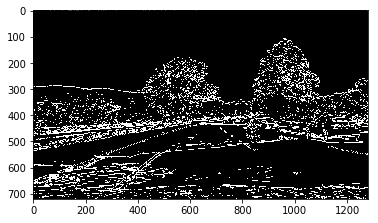

In [16]:
plt.imshow(sybinary, cmap='gray')

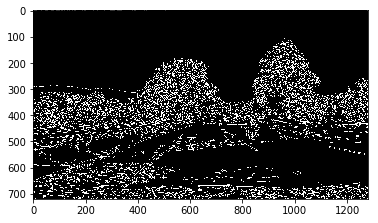

In [17]:
canny = cv2.Canny(sample_img_gray, 20, 100)
plt.imshow(canny, cmap='gray')

In [180]:
# パラメータ thresh を設定するスライダー
slider_min = widgets.IntSlider(
    min=0, max=255, step=1, value=0, description="thresh_min: ")
slider_min.layout.width = "400px"

In [181]:
# パラメータ thresh を設定するスライダー
slider_max = widgets.IntSlider(
    min=0, max=255, step=1, value=0, description="thresh_max: ")
slider_max.layout.width = "400px"

In [21]:
@interact(thresh_min=slider_min, thresh_max=slider_max)
def threshold(thresh_min, thresh_max):
    binary = np.zeros_like(scaled_sobelx)
    print('min: {}, max: {}'.format(thresh_min, thresh_max))
    binary[(scaled_sobelx >= thresh_min) & (scaled_sobelx <= thresh_max)] = 1
    plt.imshow(binary, cmap='gray')

interactive(children=(IntSlider(value=0, description='thresh_min: ', layout=Layout(width='400px'), max=255), IntSlider(value=0, description='thresh_max: ', layout=Layout(width='400px'), max=255), Output()), _dom_classes=('widget-interact',))

(sobel filter for x axis) best thresh min = 25

In [24]:
@interact(thresh_min=slider_min, thresh_max=slider_max)
def threshold(thresh_min, thresh_max):
    binary = np.zeros_like(scaled_sobely)
    print('min: {}, max: {}'.format(thresh_min, thresh_max))
    binary[(scaled_sobely >= thresh_min) & (scaled_sobely <= thresh_max)] = 1
    plt.imshow(binary, cmap='gray')

interactive(children=(IntSlider(value=25, description='thresh_min: ', layout=Layout(width='400px'), max=255), IntSlider(value=200, description='thresh_max: ', layout=Layout(width='400px'), max=255), Output()), _dom_classes=('widget-interact',))

(sobel filter for y axis) best thresh min = 40

### make function for applying Sobel Filter

In [115]:
def sobel_filter(sobel):
    """
    apply normalization for image applying sobel filter
    
    args:
        sobel(ndarray): 2-dim image array
    """
    
    abs_sobel = np.absolute(sobel)
    normalized_sobel= np.uint8(255 * abs_sobel / np.max(abs_sobel))
    return normalized_sobel

#### test

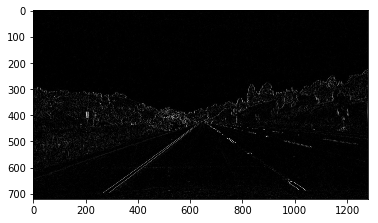

In [114]:
test_image_path = './test_images/straight_lines1_dst.jpg'
test_image = cv2.cvtColor(cv2.imread(test_image_path), cv2.COLOR_BGR2GRAY)
sobel = cv2.Sobel(test_image, cv2.CV_64F, 1, 0, ksize=3)
test_sobel = sobel_filter(
    sobel
)
plt.imshow(test_sobel, cmap='gray')

### make function for applying threshhold 

In [71]:
def apply_threshholding(gray, thresh_min=0, thresh_max=255):
    """
    create binary image based on two threshhold value toward gray scale image.
    
    args:
        gray(ndarray): 2-dim ndarray
        thresh_min(int): threshhold value for minimum activation
        thresh_max(int): threshhold value for maximum activation
    """
    
    binary = np.zeros_like(gray)
    binary[(gray >= thresh_min) & (gray <= thresh_max)] = 1
    return binary

#### test

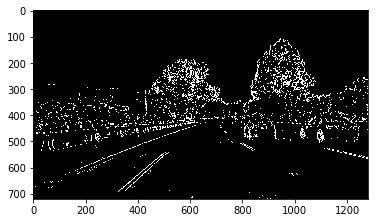

In [88]:
test_image_path = './test_images/test4_dst.jpg'
plt.imshow(
    apply_threshholding(
        sobel_filter(
            cv2.imread(test_image_path),
            direction='x',
            kernel_size=3
        ),
        thresh_min=25,
        thresh_max=200
    ),
    cmap='gray'
)

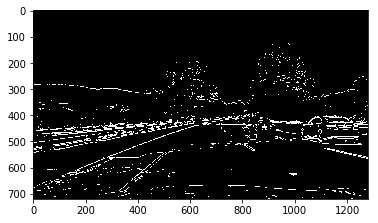

In [89]:
test_image_path = './test_images/test4_dst.jpg'
plt.imshow(
    apply_threshholding(
        sobel_filter(
            cv2.imread(test_image_path),
            direction='y',
            kernel_size=3
        ),
        thresh_min=40,
        thresh_max=200
    ),
    cmap='gray'
)

In [ ]:
binary_mask_config[]

# 4. Gradients Magnitude

In [25]:
gradmag = np.sqrt(sobelx**2 + sobely**2)

In [26]:
scale_factor = np.max(gradmag) / 255
scale_factor

3.5568649069323479

In [27]:
gradmag = (gradmag / scale_factor).astype(np.uint8)

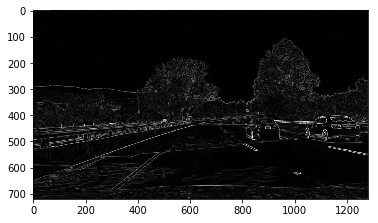

In [28]:
binary_out = np.zeros_like(gradmag)
binary_out[(gradmag >= 25) & (gradmag <= 200)] = 1
plt.imshow(gradmag, cmap='gray')

In [29]:
@interact(thresh_min=slider_min, thresh_max=slider_max)
def threshold(thresh_min, thresh_max):
    binary = np.zeros_like(gradmag)
    print('min: {}, max: {}'.format(thresh_min, thresh_max))
    binary[(gradmag >= thresh_min) & (gradmag <= thresh_max)] = 1
    plt.imshow(binary, cmap='gray')

interactive(children=(IntSlider(value=41, description='thresh_min: ', layout=Layout(width='400px'), max=255), IntSlider(value=200, description='thresh_max: ', layout=Layout(width='400px'), max=255), Output()), _dom_classes=('widget-interact',))

(sobel filter for magnitude) best thresh min = 60

### make function for applying gradient magnitude

In [90]:
def gradient_magnitude(sobelx, sobely):
    """
    get the magnitude of gradients of sobel filter for both x and y direction
    
    args:
        sobelx(ndarray): normalized 2-dim image after applying x direction sobel filter 
        sobely(ndarray): normalized 2-dim image after applying y direction sobel filter
    """
    
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag) / 255
    gradmag = (gradmag / scale_factor).astype(np.uint8)
    return gradmag

#### test

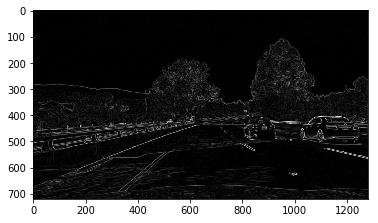

In [116]:
test_image_path = './test_images/test4_dst.jpg'
test_image = cv2.cvtColor(cv2.imread(test_image_path), cv2.COLOR_BGR2GRAY)
gradmag = gradient_magnitude(
    cv2.Sobel(test_image, cv2.CV_64F, 1, 0, 3),
    cv2.Sobel(test_image, cv2.CV_64F, 0, 1, 3),
#     sobel_filter(
#         cv2.imread(test_image_path),
#         direction='x',
#         kernel_size=3
#     ),
#     sobel_filter(
#         cv2.imread(test_image_path),
#         direction='y',
#         kernel_size=3
#     )
)
plt.imshow(gradmag, cmap='gray')

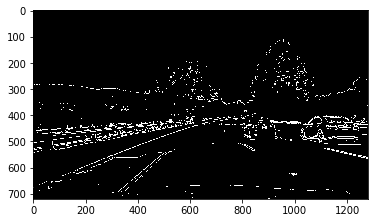

In [117]:
plt.imshow(
    apply_threshholding(
        gray=gradmag,
        thresh_min=60,
        thresh_max=200
    ),
    cmap='gray'
)

# 5. direction of Gradients

In [194]:
absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))

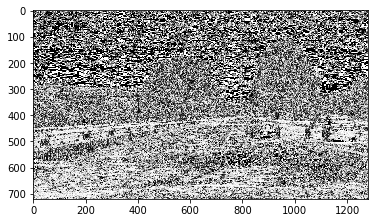

In [195]:
binary_out = np.zeros_like(absgraddir)
binary_out[(absgraddir >= np.pi/2) & (absgraddir <= 3*np.pi/2)] = 1
plt.imshow(absgraddir, cmap='gray')

In [196]:
# パラメータ thresh を設定するスライダー
float_slider_min = widgets.FloatSlider(
    min=0, max=3.14, step=0.01, value=0, description="float thresh_min: ")
float_slider_min.layout.width = "400px"

In [197]:
# パラメータ thresh を設定するスライダー
float_slider_max = widgets.FloatSlider(
    min=0, max=3.14, step=0.01, value=3.14, description="float thresh_min: ")
float_slider_max.layout.width = "400px"

In [198]:
@interact(thresh_min=float_slider_min, thresh_max=float_slider_max)
def threshold(thresh_min, thresh_max):
    binary = np.zeros_like(absgraddir)
    print('min: {}, max: {}'.format(thresh_min, thresh_max))
    binary[(absgraddir >= thresh_min) & (absgraddir <= thresh_max)] = 1
    plt.imshow(binary, cmap='gray')

interactive(children=(FloatSlider(value=0.0, description='float thresh_min: ', layout=Layout(width='400px'), max=3.14, step=0.01), FloatSlider(value=3.14, description='float thresh_min: ', layout=Layout(width='400px'), max=3.14, step=0.01), Output()), _dom_classes=('widget-interact',))

### this operation is finished by one liner, so don't have to create func

# 6. Color Gradients (HLS)

In [46]:
sample_img_hls.shape

(720, 1280, 3)

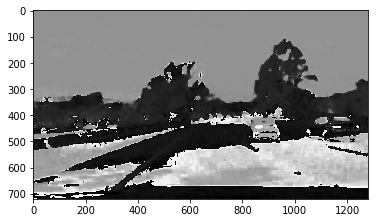

In [47]:
plt.imshow(sample_img_hls[:, :, 0], cmap='gray')

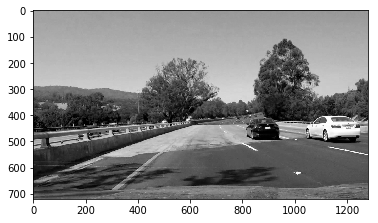

In [48]:
plt.imshow(sample_img_hls[:, :, 1], cmap='gray')

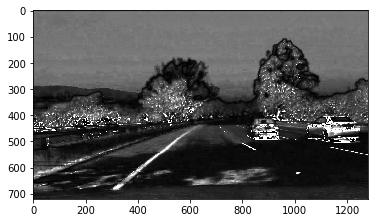

In [49]:
plt.imshow(sample_img_hls[:, :, 2], cmap='gray')

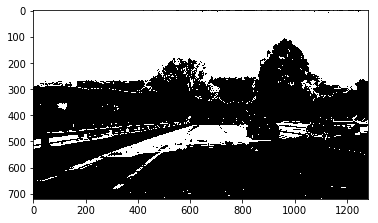

In [55]:
l_channel = sample_img_hls[:, :, 1]
l_binary = np.zeros_like(l_channel)
l_binary[(l_channel >= 150) & (l_channel <= 200)] = 1
plt.imshow(l_binary, cmap='gray')

In [50]:
s_channel = sample_img_hls[:, :, 2]

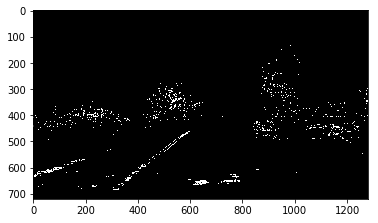

In [51]:
s_binary = np.zeros_like(s_channel)
s_binary[(s_channel >= 140) & (s_channel <= 200)] = 1
plt.imshow(s_binary, cmap='gray')

In [52]:
@interact(thresh_min=slider_min, thresh_max=slider_max)
def threshold(thresh_min, thresh_max):
    binary = np.zeros_like(s_channel)
    print('min: {}, max: {}'.format(thresh_min, thresh_max))
    binary[(s_channel >= thresh_min) & (s_channel <= thresh_max)] = 1
    plt.imshow(binary, cmap='gray')

interactive(children=(IntSlider(value=60, description='thresh_min: ', layout=Layout(width='400px'), max=255), IntSlider(value=200, description='thresh_max: ', layout=Layout(width='400px'), max=255), Output()), _dom_classes=('widget-interact',))

(s_channel filter) thresh_min is 90

### this operation is finished by one liner, so don't have to create func

# 7. Color Gradients (HSV)

In [128]:
sample_img_hsv = cv2.cvtColor(sample_img, cv2.COLOR_BGR2HSV)

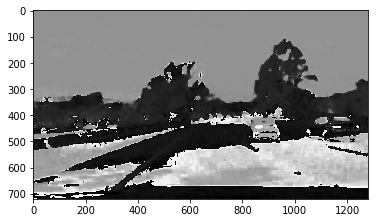

In [142]:
plt.imshow(sample_img_hls[:, :, 0], cmap='gray')

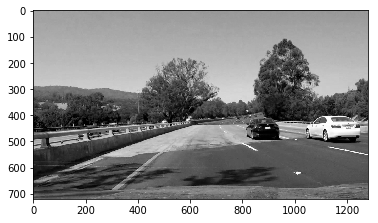

In [143]:
plt.imshow(sample_img_hls[:, :, 1], cmap='gray')

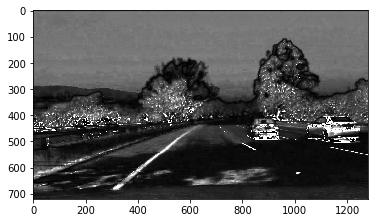

In [144]:
plt.imshow(sample_img_hls[:, :, 2], cmap='gray')

### this operation is finished by one liner, so don't have to create func

In [157]:
np.min(sample_img_hls[:, :, 2]), np.max(sample_img_hls[:, :, 2])

(0, 255)

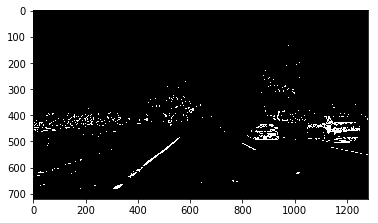

In [158]:
plt.imshow(
    apply_threshholding(
        sample_img_hls[:, :, 2],
        thresh_min=200,
        thresh_max=255
    ),
    cmap='gray'
)

# 8. Color Range

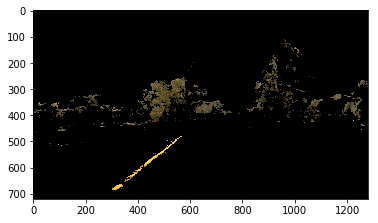

In [159]:
lower = np.array([20, 50, 50])
upper = np.array([25, 255, 255])
frame_mask = cv2.inRange(sample_img_hsv, lower, upper)
dst = cv2.bitwise_and(sample_img_hsv, sample_img_hsv, mask=frame_mask)
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_HSV2RGB))

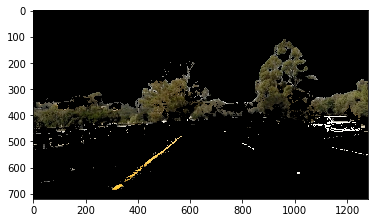

In [173]:
lower = np.array([20,0,0])
upper = np.array([40,255,255])
frame_mask = cv2.inRange(sample_img_hsv, lower, upper)
dst = cv2.bitwise_and(sample_img_hsv, sample_img_hsv, mask=frame_mask)
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_HSV2RGB))

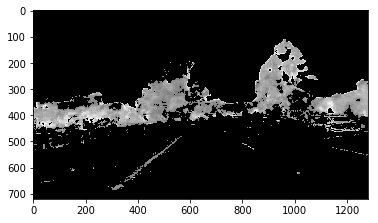

In [174]:
plt.imshow(dst[:,:,0], cmap='gray')

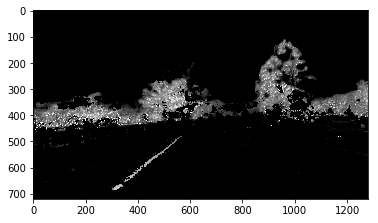

In [175]:
plt.imshow(dst[:,:,1], cmap='gray')

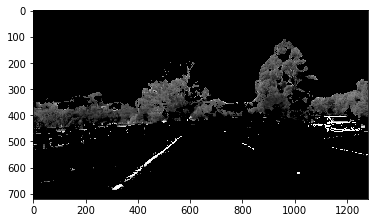

In [176]:
plt.imshow(dst[:,:,2], cmap='gray')

In [182]:
@interact(thresh_min=slider_min, thresh_max=slider_max)
def threshold(thresh_min, thresh_max):
    binary = np.zeros_like(dst[:,:,2])
    print('min: {}, max: {}'.format(thresh_min, thresh_max))
    binary[(dst[:,:,2] >= thresh_min) & (dst[:,:,2] <= thresh_max)] = 1
    plt.imshow(binary, cmap='gray')

interactive(children=(IntSlider(value=0, description='thresh_min: ', layout=Layout(width='400px'), max=255), IntSlider(value=0, description='thresh_max: ', layout=Layout(width='400px'), max=255), Output()), _dom_classes=('widget-interact',))

### make function for color inRange

In [192]:
def get_hsv_color_range(hsv, lower, upper):
    """
    get selected image between lower and upper hsv color range
    
    args:
        hsv: 3-dim OpenCV format image of HSV
        lower: lowest value of hsv
        upper: highest value of hsv
    """
    
    if (type(lower) == list) or (type(upper) == list):
        lower = np.array()
        upper = np.array()
    
    frame_mask = cv2.inRange(sample_img_hsv, lower, upper)
    dst = cv2.bitwise_and(sample_img_hsv, sample_img_hsv, mask=frame_mask)
    return dst